<a href="https://colab.research.google.com/github/frangi2002/salary_prediction/blob/main/Salary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**<h1> 1) Introduction</h1>**

<p> Welcome to the Salary analysis exploration. Throughout this notebook I have used DecisionTreeRegression() to try to predict salaries based on certain variables (Gender, Race, Schooling, Country of origin, Years of Experience, Education Level, and Age). I will also explore which features matter most in determining one's salary. In the process, I will do some high level analysis on each variable's affect on salary.</p>



**<h2>Methodology</h2>**


1. *Import Data* - import from Kaggle
2. *Data Cleaning* - eliminate missing values, eliminate double entries and eliminate incoherent text. I will test whether all data is cleaned by grouping data by category and identifying whether there are empty observations. Specifically, variations in representation that arose due to semantically equivalent information, such as 'bachelor's degree' and 'bachelors degree,' will be united
3. *Data Analysis* - A high level insight on whether there actually exists a correlation between Salary and other variables
4. *Supervised Learning* - Predict salaries based on the variables listed above and determining which of the variables has the greatest effect on Salary. Throughout the process, identify the MSE and r-squared to determine whether data is being overfitted and if the variables explain any of the variation.
5. *Concluding remarks*





In [ ]:
#Import all the necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from sklearn import tree

In [ ]:
#View Data
df = pd.read_csv("Salary_Data_Based_country_and_race.csv")
df



---


**<h1> 2) Data Cleaning</h1>**

Because I will be performing data analysis on the data sets, it is essential that the data is accurate, complete, and relevent. The dataset "Salary_Data_Based_country_and_race.csv" comes from a public Kaggle Dataset published by SUDHEER P 2147234, who in turn took it from MOHITH SAI RAM REDDY. Although no provenance is given, the purpose of this project is to test my Data Analysis skills and to tell a story from the available data.



Below, I will try to find whether the dataset is complete. I will check for missing entries, and establish a methodology to fill those values in.


---



In [ ]:
#Column names
columns = df.columns
columns

Index(['Unnamed: 0', 'Age', 'Gender', 'Education Level', 'Job Title',
       'Years of Experience', 'Salary', 'Country', 'Race'],
      dtype='object')

In [ ]:
#Find you what data types each column holds:
print(f"DATA TYPES BY CATEGORY: \n Age: {df['Age'].dtype},\n Gender: {df['Gender'].dtype},\n Education Leve:{df['Education Level'].dtype},\n Job Title: {df['Job Title'].dtype},\n Years of Experience: {df['Years of Experience'].dtype},\n Salary: {df['Salary'].dtype},\n Country: {df['Country'].dtype},\n Race: {df['Race'].dtype}\n")

DATA TYPES BY CATEGORY: 
 Age: float64,
 Gender: object,
 Education Leve:object,
 Job Title: object,
 Years of Experience: float64,
 Salary: float64,
 Country: object,
 Race: object



In [ ]:
#Find out how many empty entries there are
print(f"EMPTY CELLS BY CATEGORY: \n Age: {df['Age'].isnull().sum()},\n Gender: {df['Gender'].isnull().sum()},\n Education Level:{df['Education Level'].isnull().sum()},\n Job Title: {df['Job Title'].isnull().sum()},\n Years of Experience: {df['Years of Experience'].isnull().sum()},\n Salary: {df['Salary'].isnull().sum()},\n Country: {df['Country'].isnull().sum()},\n Race: {df['Race'].isnull().sum()}\n")

EMPTY CELLS BY CATEGORY: 
 Age: 2,
 Gender: 2,
 Education Level:3,
 Job Title: 2,
 Years of Experience: 3,
 Salary: 5,
 Country: 0,
 Race: 0





---


Because some type of data cannot physically have an 'average' (for example 'Gender'), other methods of data filling will be used. Coincidentally, 2 'Gender' entries are missing, therefore, to not skew the data, I will calculate the percentage of male and females within the dataset, and multiply it by the number of missing entries (then rounding to the nearest whole number).

I will use the same approach with 'Job Title'

I will also check for imbalances in the data. Some of the data may be inputted in different formats, and must therefore be cleaned.

This approach will allow me to keep an unbiased dataset.



---





---



In [ ]:
#Find the Average Age
df['Age'].mean()

33.62085944494181

In [ ]:
#Fill in empty cells in 'Age' dataframe with the average calculated:
df['Age'] = df['Age'].fillna(33.62085944494181)



---



In [ ]:
#Find the distribution of genders
male, female, other = df['Gender'].value_counts()

percent_of_males = male/(male+female+other) * 100
percent_of_female = female/(male+female+other) * 100
percent_of_other = other/(male+female+other) * 100

print(f"IN THE DATASET THIS IS THE DISTRIBUTION OF GENDERS ROUNDED TO THE NEAREST WHOLE NUMBER:\n Percent of male {round(percent_of_males)}%,\n Percent of female {round(percent_of_female)}%,\n Percent of other {round(percent_of_other)}%,\n")

IN THE DATASET THIS IS THE DISTRIBUTION OF GENDERS ROUNDED TO THE NEAREST WHOLE NUMBER:
 Percent of male 55%,
 Percent of female 45%,
 Percent of other 0%,



In [ ]:
empty_age_indices = df[df['Gender'].isnull()].index
empty_age_indices

Int64Index([172, 260], dtype='int64')

In [ ]:
# Fill missing values with specific replacements based on indices
replacement_dict = {172: 'Male', 260: 'Female'}
df['Gender'] = df['Gender'].fillna(replacement_dict)



---



In [ ]:
#Find the Average Education Level
df['Education Level'].value_counts()

Bachelor's Degree    2267
Master's Degree      1573
PhD                  1368
Bachelor's            756
High School           448
Master's              288
phD                     1
Name: Education Level, dtype: int64

In [ ]:
#To make sure that all PhD students are counted in the same category:
df['Education Level'] = df['Education Level'].str.lower().str.capitalize()
df['Education Level'] = df['Education Level'].replace("Bachelor's", "Bachelor's degree")
df['Education Level'] = df['Education Level'].replace("Master's", "Master's degree")

df['Education Level'].value_counts()

Bachelor's degree    3023
Master's degree      1861
Phd                  1369
High school           448
Name: Education Level, dtype: int64

In [ ]:
bachelor, master, phd, high_school = df['Education Level'].value_counts()

p_bachelor = bachelor/(bachelor + master + phd + high_school) * 100
p_master = master/(bachelor + master + phd + high_school) * 100
p_phd = phd/(bachelor + master + phd + high_school) * 100
p_high_school = high_school/(bachelor + master + phd + high_school) * 100

print(f"DISTRIBUTION OF THE EDUCATION LEVEL EDUCATION:\n Percent of Bachelors {round(p_bachelor)}%,\n Percent of Masters {round(p_master)}%,\n Percent of Phd {round(p_phd)}%,\n Percent of High School {round(p_high_school)}%")

DISTRIBUTION OF THE EDUCATION LEVEL EDUCATION:
 Percent of Bachelors 45%,
 Percent of Masters 28%,
 Percent of Phd 20%,
 Percent of High School 7%


In [ ]:
print(f"EXPECTED NUMBER OF EDUCATION LEVEL:\n Number of Bachelors {round(3*p_bachelor/100)},\n Number of Masters {round(3 * p_master/100)},\n Number of Phd {round(3*p_phd/100)},\n Number of High School {round(3*p_high_school/100)}")

EXPECTED NUMBER OF EDUCATION LEVEL:
 Number of Bachelors 1,
 Number of Masters 1,
 Number of Phd 1,
 Number of High School 0


In [ ]:
indices = df[df['Education Level'].isnull()].index.values
indices

array([ 172,  260, 2011])

In [ ]:
# Fill missing values with specific replacements based on indices
replacement_dict_EDUCATION = {172: "Bachelor's degree", 260: "Master's degree", 2011: "Phd"}
df['Education Level'] = df['Education Level'].fillna(replacement_dict_EDUCATION)



---



In [ ]:
#Find the Average Years of Experience
df['Years of Experience'].mean()

8.094687360095508

In [ ]:
df['Years of Experience'] = df['Years of Experience'].fillna(8.094687360095508)

In [ ]:
df['Years of Experience'] = round(df['Years of Experience'])



---



In [ ]:
#Find the Average Salary
df['Salary'].mean().round(0)

115327.0

In [ ]:
df['Salary'] = df['Salary'].fillna(115327.0)



---



In [ ]:
#Find the distribution of Job Title
df['Job Title'].value_counts()


Software Engineer             518
Data Scientist                453
Software Engineer Manager     376
Data Analyst                  363
Senior Project Engineer       318
                             ... 
Account Manager                 1
Help Desk Analyst               1
Senior Training Specialist      1
Junior Web Designer             1
Supply Chain Analyst            1
Name: Job Title, Length: 193, dtype: int64

In [ ]:
df[df['Job Title'].isnull()].index.values

array([172, 260])

In [ ]:
# Fill missing values with specific replacements based on indices
replacement_dict_JobTitle = {172: "Software Engineer", 260: "Data Scientist"}
df['Job Title'] = df['Job Title'].fillna(replacement_dict_JobTitle)



---



In [ ]:
#Find out how many empty entries there are
print(f"EMPTY CELLS BY CATEGORY: \n Age: {df['Age'].isnull().sum()},\n Gender: {df['Gender'].isnull().sum()},\n Education Level:{df['Education Level'].isnull().sum()},\n Job Title: {df['Job Title'].isnull().sum()},\n Years of Experience: {df['Years of Experience'].isnull().sum()},\n Salary: {df['Salary'].isnull().sum()},\n Country: {df['Country'].isnull().sum()},\n Race: {df['Race'].isnull().sum()}\n")

EMPTY CELLS BY CATEGORY: 
 Age: 0,
 Gender: 0,
 Education Level:0,
 Job Title: 0,
 Years of Experience: 0,
 Salary: 0,
 Country: 0,
 Race: 0





---
**<h1>3) Data Analysis</h1>**
Finally, there remain no more empty cells. All data has been cleaned, and I am now ready to do some basic analysis using matplotlib



---



In [ ]:
slope, intercept, r_value, p_value, std_err = linregress(df['Years of Experience'], df['Salary'])
intercept

58279.569995877035

Text(0.5, 0, 'Years of Experience')

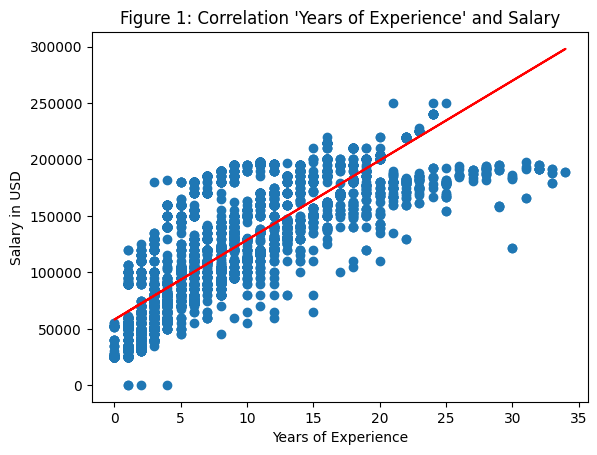

In [ ]:
plt.scatter(df['Years of Experience'], df['Salary'] )
plt.plot(df['Years of Experience'], slope * np.array(df['Years of Experience']) + intercept, color='r', label='Line of Best Fit')
plt.title("Figure 1: Correlation 'Years of Experience' and Salary")
plt.ylabel("Salary in USD")
plt.xlabel("Years of Experience")

In [ ]:
slope1, intercept, r_value, p_value, std_err = linregress(df['Age'], df['Salary'])
intercept

-54304.417444522274

Text(0.5, 0, 'Age')

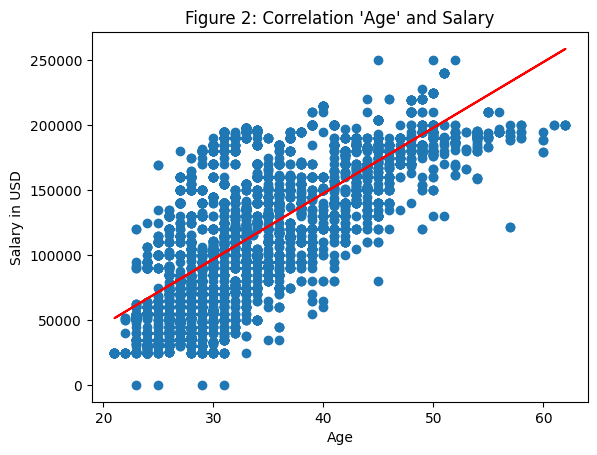

In [ ]:
plt.scatter(df['Age'], df['Salary'] )
plt.plot(df['Age'], slope1 * np.array(df['Age']) + intercept, color='r', label='Line of Best Fit')
plt.title("Figure 2: Correlation 'Age' and Salary")
plt.ylabel("Salary in USD")
plt.xlabel("Age")

In [ ]:
female, male, other = df.groupby('Gender')['Salary'].mean()
gender_salaries = [female, male, other]
salary_labels = ['Female', 'Male', 'Other']

Text(0, 0.5, 'Salary in USD')

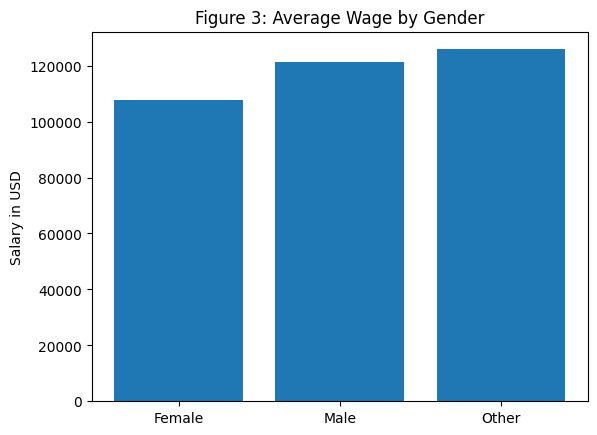

In [ ]:
plt.bar(salary_labels, gender_salaries)
plt.title("Figure 3: Average Wage by Gender")
plt.ylabel("Salary in USD")


In [ ]:
education_level_mapping = {
    "High school": 12,
    "Master's degree": 18,
    "Bachelor's degree": 16,
    "Phd": 22,
}

df['Education Level Normalized'] = df['Education Level'].replace(education_level_mapping)

df['Education Level Normalized']

0       16
1       18
2       22
3       16
4       18
        ..
6699    22
6700    12
6701    16
6702    18
6703    12
Name: Education Level Normalized, Length: 6704, dtype: int64

Text(0, 0.5, 'Salary USD')

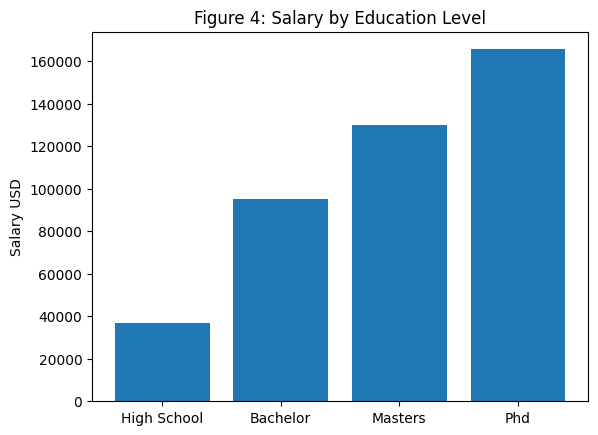

In [ ]:
high, bachelor, masters, phd = df.groupby('Education Level Normalized')['Salary'].mean()
education_salary = [high, bachelor, masters, phd]
education_salary_label = ['High School', 'Bachelor', 'Masters', 'Phd']

plt.bar(education_salary_label, education_salary)
plt.title('Figure 4: Salary by Education Level')
plt.ylabel('Salary USD')

In [ ]:
race = df.groupby('Race')['Salary'].mean()
race

Race
African American    112209.658192
Asian               115302.068621
Australian          114236.676991
Black               118601.212815
Chinese             111139.315315
Hispanic            110410.139752
Korean              117099.757112
Mixed               116330.859281
Welsh               112560.645646
White               117066.624492
Name: Salary, dtype: float64

<BarContainer object of 10 artists>

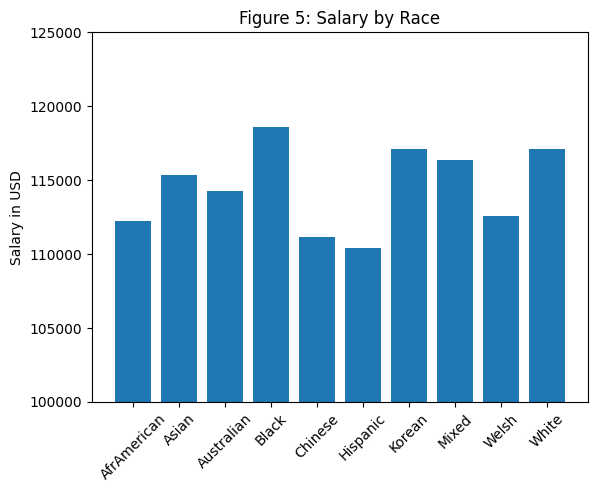

In [ ]:
African_American, Asian, Australian, Black, Chinese, Hispanic, Korean, Mixed, Welsh, White = df.groupby('Race')['Salary'].mean()

race_label = ['AfrAmerican', 'Asian', 'Australian', 'Black', 'Chinese', 'Hispanic', 'Korean', 'Mixed', 'Welsh', 'White']
race_salary = [African_American, Asian, Australian, Black, Chinese, Hispanic, Korean, Mixed, Welsh, White]
plt.ylim(100000, 125000)
plt.xticks(rotation=45)
plt.title('Figure 5: Salary by Race')
plt.ylabel('Salary in USD')
plt.bar(race_label, race_salary)

In [ ]:
country = df.groupby('Country')['Salary'].mean()
country_label = ['Australia','Canada', 'China', 'UK', 'USA']

Text(0, 0.5, 'Salary in USD')

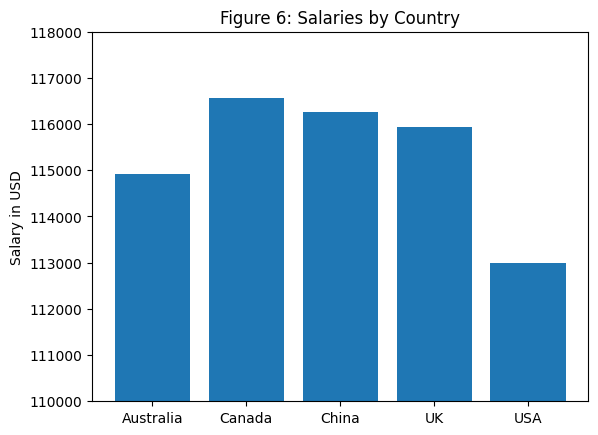

In [ ]:
plt.bar(country_label, country)
plt.ylim(110000, 118000)
plt.title('Figure 6: Salaries by Country')
plt.ylabel('Salary in USD')

**<h1> 3) Predicting Salary</h1>**
<p>The Decision Tree Regression method is well-suited for our model due to its inherent capacity to discern non-linear relationships and intricate interactions among the independent variables. This technique effectively partitions the feature space, delineating distinct regions to predict the average target value within each partition. Its compelling attributes render it a fitting choice for the analysis of our dataset.

Furthermore, Decision Tree Regression inherently incorporates interactions between features. By effectively partitioning the feature space, it captures the combined effect of multiple features, thereby discerning complex interactions that might elude linear models. The hierarchical tree structure of the decision-making process also facilitates transparency and interpretability, enabling us to discern the primary contributing factors affecting the predicted values.

A critical advantage of this approach is its provision of feature importance scores, which elucidate the relative significance of each feature in predicting the target variable. This valuable insight facilitates feature selection and enhances our understanding of the principal determinants influencing salary within our analysis.

Nonetheless, while the decision tree method possesses commendable attributes, we must remain vigilant to the potential issue of overfitting. The model may inadvertently capture noise or inconsequential fluctuations in the data, thus compromising its generalization capability. To mitigate this concern, well-established techniques such as pruning and ensemble methods, exemplified by Random Forests, can be judiciously employed to enhance the model's performance and robustness.

In summation, the Decision Tree Regression method emerges as a compelling and pragmatic choice for our model, offering a powerful framework to explore non-linear relationships, interactions, and key determinants influencing salary. Its transparent nature, ability to handle missing data, and provision of feature importance scores contribute to the robustness and interpretability of our analysis.</p>

In [ ]:
df_encoded = pd.get_dummies(df, columns=["Gender", "Race", "Education Level", "Country", "Years of Experience", "Age"], drop_first=True)
df_encoded = df_encoded.drop(columns=['Salary', 'Education Level Normalized', 'Job Title', 'Unnamed: 0'])
df_encoded

,Gender_Male,Gender_Other,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,...,Age_52.0,Age_53.0,Age_54.0,Age_55.0,Age_56.0,Age_57.0,Age_58.0,Age_60.0,Age_61.0,Age_62.0
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6699,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6700,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6701,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6702,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

X = df_encoded
Y = df['Salary']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)


clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train, Y_train)

In [ ]:
# Plot the decision tree
tree.plot_tree(clf, feature_names=X.columns, filled=True, rounded=True)

In [ ]:
fig, ax = plt.subplots(figsize=(200, 120))

# Plot the decision tree with the specified size
tree.plot_tree(clf, feature_names=X.columns, filled=True, rounded=True, ax=ax, fontsize=20)

# Show the plot
plt.show()

In [141]:
# Make predictions on the test set
Y_pred = clf.predict(X_test)

mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

Mean Squared Error: 376967109.39981794
R-squared: 0.8588502788127897


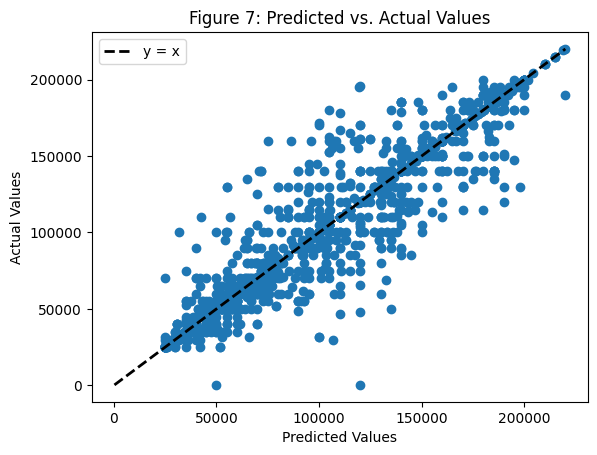

In [147]:
plt.scatter(Y_pred, Y_test)
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], 'k--', lw=2, label='y = x')
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values")
plt.title("Figure 7: Predicted vs. Actual Values")
plt.legend()
plt.show()

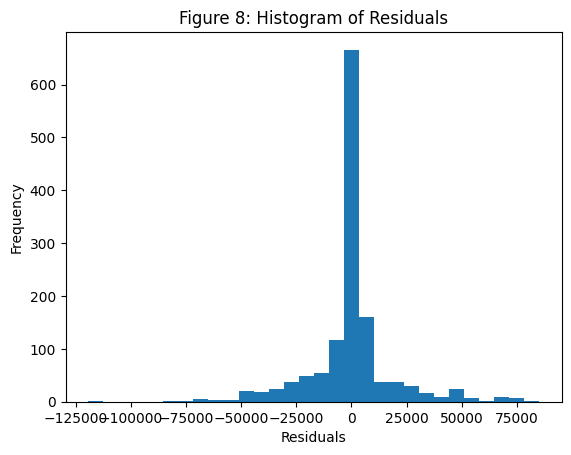

In [153]:
residuals = Y_test - Y_pred

plt.hist(residuals, bins=30)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Figure 8: Histogram of Residuals")
plt.show()

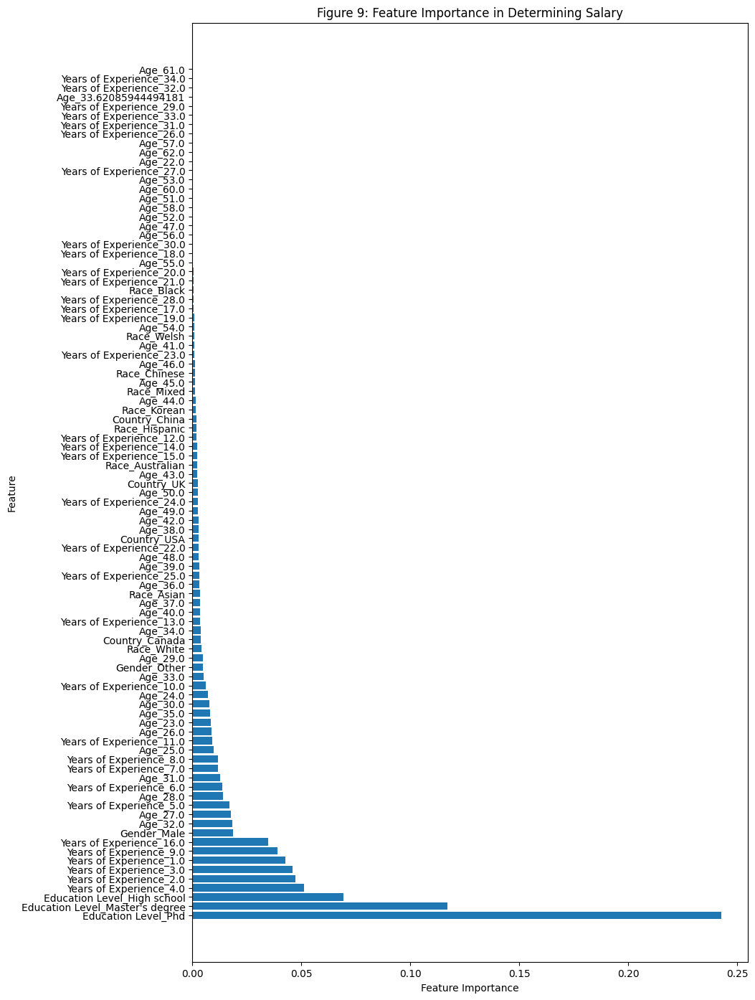

In [155]:
# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame to visualize the feature importances
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
importance_df.sort_values(by='Importance', ascending=False, inplace=True)

# Plot the feature importances
plt.figure(figsize=(10, 17))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Figure 9: Feature Importance in Determining Salary')
plt.show()